<a href="https://colab.research.google.com/github/ilhamiy/PythonVeriGorsellestirme/blob/main/PythonMekansalEtkilesimliAnimasyonGorsellestirmeler.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Veri Görselleştirmesi



---



# Veri Hakkında Genel Bilgi

Bu veri seti aşağıda verilen linkten alınmıştır. Data dictionary ve açıklamalar, ilgili linkte bulunmaktadır.


 https://github.com/rfordatascience/tidytuesday/blob/master/data/2019/2019-08-20/readme.md

# Kütüphanelerin Yüklenmesi ve Verinin Okutulması

In [ ]:
!apt-get -qq install -y libproj-dev proj-data proj-bin
!apt-get -qq install -y libgeos-dev
!apt-get -qq install -y libgdal-dev

!pip install --no-binary shapely shapely --force
!pip install cartopy


Selecting previously unselected package proj-bin.
(Reading database ... 121666 files and directories currently installed.)
Preparing to unpack .../proj-bin_8.2.1-1_amd64.deb ...
Unpacking proj-bin (8.2.1-1) ...
Setting up proj-bin (8.2.1-1) ...
Processing triggers for man-db (2.10.2-1) ...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 279.7/279.7 kB 5.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 65.1 MB/s eta 0:00:00
  Created wheel for shapely: filename=shapely-2.0.2-cp310-cp310-linux_x86_64.whl size=1027282 sha256=48ce7682dcdd80003e542e0656a07aea24279fa43143187cfceff690ad4c049a
  Stored in directory: /root/.cache/pip/wheels/1f/6b/52/14cb4558cddc0fd89de08f0e1fd08f816f4f3e1969311377c6
Successfully built shapely
  Attempting uninstall: numpy
    Found existing installation: numpy

## Verinin okutulması

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib.animation as animation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.cm as cm
import plotly.express as px

url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2019/2019-08-20/nuclear_explosions.csv?raw=true'
df = pd.read_csv(url, index_col=0)
print(df.head(5))

           year  id_no country      region source  latitude  longitude  \
date_long                                                                
19450716   1945  45001     USA  ALAMOGORDO    DOE     32.54    -105.57   
19450805   1945  45002     USA   HIROSHIMA    DOE     34.23     132.27   
19450809   1945  45003     USA    NAGASAKI    DOE     32.45     129.52   
19460630   1946  46001     USA      BIKINI    DOE     11.35     165.20   
19460724   1946  46002     USA      BIKINI    DOE     11.35     165.20   

           magnitude_body  magnitude_surface  depth  yield_lower  yield_upper  \
date_long                                                                       
19450716              0.0                0.0  -0.10         21.0         21.0   
19450805              0.0                0.0  -0.60         15.0         15.0   
19450809              0.0                0.0  -0.60         21.0         21.0   
19460630              0.0                0.0  -0.20         21.0         21.

In [ ]:
df.describe()

,year,id_no,latitude,longitude,magnitude_body,magnitude_surface,depth,yield_lower,yield_upper
count,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2048.000000,2046.000000
mean,1970.899074,70933.799610,35.397331,-36.048777,2.144905,0.355826,-0.489633,209.217532,323.431021
std,10.367353,10359.735645,23.403654,100.864340,2.624897,1.202229,10.967699,1641.346929,2055.203066
min,1945.000000,45001.000000,-49.500000,-169.320000,0.000000,0.000000,-400.000000,0.000000,0.000000
25%,1962.000000,62139.500000,37.000000,-116.054000,0.000000,0.000000,0.000000,0.000000,18.250000
50%,1970.000000,70021.000000,37.100000,-116.000000,0.000000,0.000000,0.000000,0.001000,20.000000
75%,1979.000000,79044.500000,49.870000,78.000000,5.100000,0.000000,0.000000,20.000000,150.000000
max,1998.000000,98005.000000,75.100000,179.220000,7.400000,6.000000,1.451000,50000.000000,50000.000000


# Soru 1 - Zamanla Amerika'nın ve Sovyetler Birliği'nin yapmış olduğu nükleer patlamalar nasıl değişti? - (Zamansal)

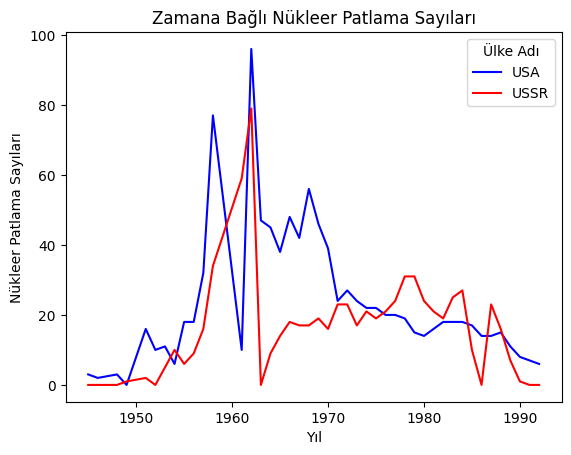

In [ ]:
# Amerika ve Sovyetler Birliği'nin filtrelenmesi
filtered_df = df[df['country'].isin(['USA', 'USSR'])]

# Sene ve ülkelere göre gruplandırılıp yıllara göre nükleer patlama sayılarının çıkartılması
explosion_counts = filtered_df.groupby(['year', 'country']).size().unstack()

# Veri olmayan seneler için 0 yazılması
explosion_counts = explosion_counts.fillna(0)

# Görselin çizilmesi
fig, ax = plt.subplots()
ax.plot(explosion_counts.index, explosion_counts['USA'], label='USA', color='blue')
ax.plot(explosion_counts.index, explosion_counts['USSR'], label='USSR', color='red')
ax.set_xlabel('Yıl')
ax.set_ylabel('Nükleer Patlama Sayıları')
ax.set_title('Zamana Bağlı Nükleer Patlama Sayıları')
ax.legend(title = "Ülke Adı")
plt.show()


----------------------------------------

Veri işareti: Line

Kullanılan görsel kanallar:

X-pozisyon: Yıl

Y-pozisyon: Nükleer Patlama Sayıları

Renk: Ülke (USA, USSR)

----------------------------------------

İki ülkeden de çıkmış olan nükleer patlamaların 1960'lı senelerde zirve yaptığı görülmektedir.

Ülkelere ayrı ayrı baktığımızda ise Sovyetler Birliği'nin sebep olduğu patlamaların 1960'ların başında zirve yaptığını ve sonrasında 0'lara kadar inip tekrardan zamanla 40'lara kadar arttığı görülmektedir. Ancak sonrasında, 1990'larda tekrardan 0'lara indiği gözlemlenmektedir.

Amerika'da ise 1960'larda sebep olunan nükleer patlama sayısı senede 100'e kadar çıkmış, sonrasında 40-60 bandında seyreden, ardından ise 1970'ten itibaren azalan bir trend görülmektedir. 1990'lı yıllarda da yaklaşık senede 10 nükleer patlama civarında olduğu gözlemlenmektedir.

Genel olarak Amerika'nın Sovyetler Birliği'nden daha fazla nükleer patlamaya sebep olduğu görülmektedir. Sadece 1975-1985 yılları arasında Sovyetler Birliği'nin çoğu senede Amerika'dan daha fazla nükleer patlamaya sebep olduğu görülmektedir.


------------------------------

# Soru 2 - Zamanla Nükleer patlamalara sebep olan cihazların çıkış konumları ve büyüklüğü nasıl değişti? - (Zamansal, Mekansal, Animasyon)

In [ ]:

explosion_data = df

# Cartopy için figür ve eksenin oluşturulması
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)

# Eksen limitlerinin belirlenmesi
ax.set_extent([df['longitude'].min(), df['longitude'].max(), df['latitude'].min(), df['latitude'].max()], crs=ccrs.PlateCarree())

# Patlamalar için scatter'ın oluşturulması
scatter = ax.scatter([], [], c=[], cmap='coolwarm', s=50, alpha=0.7, transform=ccrs.PlateCarree())

# Yıl lejantının ilk kısmı
year_text = ax.text(0.95, 0.95, '', transform=ax.transAxes, ha='right', va='top')

# Scatter ve yıl textinin güncellenmesi için yazılmış olan fonksiyon
def update(frame):
    year = frame + 1945
    data = explosion_data[explosion_data['year'] == year]

    scatter.set_offsets(data[['longitude', 'latitude']])
    scatter.set_array(data['magnitude_body'])
    scatter.set_clim(explosion_data['magnitude_body'].min(), explosion_data['magnitude_body'].max())
    year_text.set_text(f'Yıl: {year}')

# Animasyonun oluşturulması
ani = animation.FuncAnimation(fig, update, frames=range(54), interval=500, repeat=False)

# Renk barının oluşturulması
cbar = fig.colorbar(scatter, ax=ax, label='Magnitude Body (mb)', pad=0.05, fraction=0.02)

# Başlık eklenmesi
fig.suptitle('Zamana Bağlı Nükleer Patlamalara Sebep Olan Cihazların Çıkış Konumları ve Patlamanın Büyüklüğü Animasyonu')

# Noktaları şeffaf hale getirmek
scatter.set_alpha(0.5)

# Animasyonun gösterilmesi
plt.close()
from IPython.display import HTML
HTML(ani.to_jshtml())


/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/usr/local/lib/python3.10/dist-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


----------------------------------------


Veri işareti: Point

Kullanılan görsel kanallar:

X-pozisyon: latitude

Y-pozisyon: longitude

Renk: Magnitude Body (mb)

Zaman: Yıl

----------------------------------------

Yapılan görsel çalışmada zamana bağlı nükleer patlamalara sebep olan cihazların çıkış konumlarını ve patlamanın büyüklüğünü gösteren bir animasyon yer oluşmaktadır. Veri seti, 1945 ile 1998 yılları arasındaki patlamalara sebep olan cihazların konum bilgilerini ve patlamanın büyüklüğünü içermektedir. Harita üzerindeki noktalar, patlamanın gerçekleştiği konumları gösterirken, noktaların renkleri patlamanın büyüklüğünü temsil eder. Animasyon, yılın değişmesiyle birlikte patlamaların konumlarını ve büyüklüklerini günceller ve yıl bilgisini görüntüler. Ayrıca, renk legendi aracılığıyla patlamanın büyüklüğüne göre renkler verilmiştir. Bir sene içerisinde aynı konumdan çıkmış olan patlamaların fark edilebilmesi için noktalara şeffaflık eklenmiştir. Böylelikle üst üste gelen noktaların daha rahat görülebilmesi amaçlanmıştır.

Toplam nükleer patlama sayısının zamanla arttığı ancak 1990'larla birlikte çok azaldığı görülmektedir.

1960'lardan itibaren Amerika'nın belli bir bölgesinden sürekli olarak nükleer patlama cihazının varlığı animasyonda dikkat çekmektedir. Aynı zamanda renkler ilk zamanlarda sıklıkla maviyken (yani patlamaların magnitude body değeri düşükken), 1965'lerden sonra kırmızı renkte, yani yüksek magnitude body değeri olan patlamaların arttığı fark edilmektedir. Bu sebeple, zamanla patlamaların etkisinin de arttığı gözlemlenmektedir.



----------------------------------------

# Soru 3 - Nükleer patlama sayıları ülke ve bölgeler bazında nasıl değişiklik gösteriyor? - (Etkileşimli)

In [ ]:


# Ülke renklerinin belirlenmesi
country_colors = {
    'CHINA': 'yellow',
    'FRANCE': 'navy-blue',
    'INDIA': 'green',
    'PAKIST': 'orange',
    'UK': 'purple',
    'USA': 'blue',
    'USSR': 'red'
}

# Veriyi ülke ve bölge bazında gruplayıp patlama sayısının hesaplanması
explosion_counts = df.groupby(['country', 'region']).size().reset_index(name='explosion_count')

# Etkileşimli treemap oluşturma
fig = px.treemap(explosion_counts, path=['country', 'region'], values='explosion_count',
                 color='country', color_continuous_scale='viridis',
                 color_discrete_map=country_colors)

# Pop-up'ı düzenleme
fig.update_traces(hovertemplate='Bölge: %{label}<br>Ülke: %{parent}<br>Nükleer Patlama Sayısı: %{value}', root_color="lightgrey")
fig.update_layout(margin = dict(t=50, l=25, r=25, b=25))
fig.update_layout(title='1945-1998 Yılları Arasında Ülke ve Bölge Bazında Nükleer Patlama Sayıları')
fig.show()


----------------------------------------


Veri işareti: Box

Kullanılan görsel kanallar:

Kutu büyüklüğü: Nükleer Patlama Sayısı

Renk: Ülke

Nested kutular: Ülke - Bölge

----------------------------------------

Bu treemap'le birlikte, ülkelerin ve bölgelerinin nükleer patlama sayılarını gmsterilmektedir. Her bir kutunun boyutu, o ülkenin toplam patlama sayısını yansıtır. Ülke adı ve bölge adı, kutunun üzerine gelindiğinde görüntülenir.

Ayrıca, kutunun rengi, her ülkeye özel olarak belirlenen renkle ilişkilendirilir. Örneğin, Amerika'yı temsil eden kutular mavi renkle, Sovyetler Birliği'ni temsil eden kutular kırmızı renkle gösterilmektedir.

Bu treemap, veri setindeki nükleer patlamaların ülkelere ve bölgelere göre dağılımını açık bir şekilde görselleştirir. İlgili renkler, her bir ülkenin hızla ayırt edilmesini sağlar ve kutuların boyutları, patlama sayılarına göre görsel bir karşılaştırma sunar. Böylece, veri setindeki nükleer patlamaların dağılımı daha kolay anlaşılabilir.

Aynı zamanda etkileşimli olması sebebiyle ülkeler özelinde drill-down yapılıp bölgelerin daha rahat incelenmesi sağlanabilir. Ülkelerin kendi aralarındaki kıyaslamaları yapılabilirken, ülke içerisinde bölgeler de rahatlıkla kıyaslanabilir.

Görsel incelendiğinde ise en çok nükleer patlayıcı cihazlar sırasıyla Amerika, Sovyetler Birliği ve Fransa'da olduğu gözlemlenmiştir. Ülkelerin bölgeleri incelendiğinde ise Amerika'da en çok NTS bölgesinin bulunduğu, Sovyetler Birliği'nde ise en çok Semi Kazakh bölgesinin bulunduğu gözlemlenmektedir.

Ayrıca Amerika'nın NTS bölgesinden çıkmış olan cihazların sebep olduğu nükleer patlama sayısının Sovyetler Birliği'nin toplam sebep olduğu patlama sayısından daha fazla olduğu da gözlemlenmektedir.

----------------------------------------